In [1]:
"""Inject js code for jupyter notebook"""
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
%%javascript
<!-- Ignore this block -->
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
from __future__ import division
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt, log
from collections import Counter
from itertools import groupby
import copy
"""Diagraph installation required for drawing graph"""
from graphviz import Digraph
from queue import Queue
import matplotlib
import matplotlib.gridspec as gridspec
from math import log
from IPython.display import HTML, display

In [4]:
"""Set RC Params for matplotlib global"""
font = {'size'   : 16}
matplotlib.rc('font', **font)

# Helper methods

In [5]:
"""Procedure returns mode in data x"""
def getMode(x):
    frequency = groupby(Counter(x).most_common(), lambda x:x[1])
    mode = [val for val,count in frequency.__next__()[1]]
    return mode

In [6]:
"""Following methods are used to get probability from distribution and get max probability from distribution"""
def getProbability(x):
    prob = {}
    for target in np.unique(x):
        prob[target] = ((np.count_nonzero(x == target))*1.0)/len(x)
    return prob


def getMaxProbability(prob):
    
    target = None
    targetProbability = 0
    for label in prob.keys():
        if prob[label] > targetProbability:
            targetProbability = prob[label]
            target = label
    return target

In [7]:
"""Splits the provided pandas dataframe into training and test dataset"""
def splitDataSet(inputDataframe, trainSetSize):
    
        trainSet = inputDataframe.sample(frac = trainSetSize)
        testSet = inputDataframe.drop(trainSet.index)
        trainSet.reindex()
        testSet.reindex()
        return trainSet, testSet

## Draw tree
This method will draw tree. It uses graphviz, must be installed.

In [8]:
def drawTree(node, depth):
    
    if node.leftNode != None and node.rightNode!=None:
        
        graph.edge("InstanceId "+str(node)+"\nSplit Decision "+str(node.label)+"\nInformationGain "+str(node.score), "InstanceId "+str(node.leftNode)+"\nSplit Decision "+str(node.leftNode.label)+"\nInformationGain "+str(node.leftNode.score), label="True")
        graph.edge("InstanceId "+str(node)+"\nSplit Decision "+str(node.label)+"\nInformationGain "+str(node.score), "InstanceId "+str(node.rightNode)+"\nSplit Decision "+str(node.rightNode.label)+"\nInformationGain "+str(node.rightNode.score), label="False")
        drawTree(node.leftNode, depth+1)
        drawTree(node.rightNode, depth+1)

# Model

## Misclassification rate

In [9]:
def misclassificationRate(yTrue, yPrediction):
    diff = 0
    for i,j in zip(yTrue, yPrediction):
        if i != j:
            diff = diff + 1
    
    return (1.0/len(yTrue))*diff

## Node

In [10]:
"""Node type for seperating leaf node from inner nodes"""
class NodeType:
    LEAFNODE = 0
    INNERNODE = 1 

"""
lambdaExpr is used for storing the evaluation function. Should return True or False
score will store any score for node. Eg Entropy or Gini index
label will have label for node. In case of leaf node the label is the required value and for inner node is the expression
depth will store the depth of node
probability will be a dictionary with targets and their probability"""

class Node:

    leftNode = None
    rightNode = None 
    lambdaExpr = None
    score = None
    label = None
    nodeType = None
    depth = None
    probability = None

## SplitFunction
Cross Entropy
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/70b8bc9f2666c42790b5aa20b13a55bdc503dbb7">
Information Gain
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/264134245f420035af0c4c96bf1c66b9b106ff20">
Gini Impurity
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/a1b18607c9b6746f9182940d09a0a1bf5fe7ce62">

In [11]:
"""Split quality function for decision trees"""
class SplitFunction:
    
    @staticmethod
    def CrossEntropy(x, y, splitRule = None):
        
        targets = np.unique(y)
        """Generate cross entropy without splitting the data"""

        if splitRule == None:
            crossEntropy = 0
            for target in targets:
                targetProbability = (np.count_nonzero(y == target) * 1.0)/len(y)
                crossEntropy = crossEntropy - (targetProbability * log(targetProbability, 2))
            return crossEntropy, [], [], []
        
        """Generate cross entropy with splitting criterion"""
        leftChildFunctionEntropy = 0
        rightChildFunctionEntropy = 0

        
        mask = np.apply_along_axis(splitRule, 1, x)
        
        leftSplit = y[mask]
        rightSplit = y[~mask]

        """No homogenious seperation found"""
        if len(leftSplit) == 0 or len(rightSplit) == 0:
            return SplitFunction.CrossEntropy(x, y)
        
        """For plotting"""
        targetValues = []
        leftChildDistribution = []
        rightChildDistribution = []
        
        """Calculate entropy"""
        for target in targets:
            targetValues.append(target)
            
            leftTargetCount = np.count_nonzero(leftSplit == target)
            leftTargetProbability = (leftTargetCount * 1.0)/len(leftSplit)
            leftChildDistribution.append(leftTargetProbability)
            
            rightTargetCount = np.count_nonzero(rightSplit == target)
            rightTargetProbability = (rightTargetCount * 1.0)/len(rightSplit)
            rightChildDistribution.append(rightTargetProbability)

            
            if leftTargetProbability != 0:
                leftTargetEntropy = -(leftTargetProbability * log(leftTargetProbability, 2))
                leftChildFunctionEntropy = leftChildFunctionEntropy + leftTargetEntropy
            
            if rightTargetProbability != 0:
                rightTargetEntropy = - (rightTargetProbability * log(rightTargetProbability, 2))
                rightChildFunctionEntropy = rightChildFunctionEntropy + rightTargetEntropy
                
        """Weighted entropy"""
        weightedEntropy = (leftChildFunctionEntropy * ((len(leftSplit) * 1.0)/len(y))) + (rightChildFunctionEntropy * ((len(rightSplit) * 1.0)/len(y)))
        
        """Only weightedEntropy is needed. Rest are used for plotting the graphs"""
        return weightedEntropy, targetValues, leftChildDistribution, rightChildDistribution
    
    @staticmethod
    def GiniIndex(x, y, splitRule = None):

        targets = np.unique(y)
        """Generate gini impurity without spitting data"""

        if splitRule == None:
            giniIndex = 1
            for target in targets:
                targetProbability = (np.count_nonzero(y == target) * 1.0)/len(y)
                giniIndex = giniIndex - (targetProbability * targetProbability)
            return giniIndex, [], [], []
        
        """Generate gini impurity with splitting criterion"""
        leftChildGiniImpurity = 1
        rightChildGiniImpurity = 1

        
        mask = np.apply_along_axis(splitRule, 1, x)
        
        leftSplit = y[mask]
        rightSplit = y[~mask]

        """No homogenious seperation found"""
        if len(leftSplit) == 0 or len(rightSplit) == 0:
            return SplitFunction.GiniIndex(x, y)
               
        targetValues = []
        leftChildDistribution = []
        rightChildDistribution = []
        
        """Calculate Gini impurity"""
        for target in targets:
            targetValues.append(target)
            
            leftTargetCount = np.count_nonzero(leftSplit == target)
            leftTargetProbability = (leftTargetCount * 1.0)/len(leftSplit)
            leftChildDistribution.append(leftTargetCount)
            
            rightTargetCount = np.count_nonzero(rightSplit == target)
            rightTargetProbability = (rightTargetCount * 1.0)/len(rightSplit)
            rightChildDistribution.append(rightTargetCount)

            leftChildGiniImpurity = leftChildGiniImpurity - (leftTargetProbability * leftTargetProbability)
            rightChildGiniImpurity = rightChildGiniImpurity - (rightTargetProbability * rightTargetProbability)
                        
        """Weighted entropy"""
        weightedGiniImpurity = (leftChildGiniImpurity * ((len(leftSplit) * 1.0)/len(y))) + (rightChildGiniImpurity * ((len(rightSplit) * 1.0)/len(y)))
        
        """Only weightedEntropy is needed. Rest are used for plotting the graphs"""
        return weightedGiniImpurity, targetValues, leftChildDistribution, rightChildDistribution

## Split criterion generator.
This method generates different splits based upon the data type.

In [12]:
"""Feature data type"""
class DType:
    CONTINOUS = 0
    CATEGORICAL = 1
    ORDINAL = 2

class SplitCriterionGenerator:
    
    """Generate split criterion for categorical data"""
    @staticmethod
    def caterogicalFeaturesSplitGenerator(targetValues, index = None, label = None):
        splitCriterion = {}
        
        for target in np.unique(targetValues):
            if index == None:
                splitCriterion[lambda x: x==target] = "X = "+str(target)
            else:
                expr = eval("lambda x: x["+str(index)+"] == "+str(target))
                splitCriterion[expr] = "X["+label+"] = "+str(target)
        return splitCriterion
    
    """Generate split criterion for categorical data"""
    @staticmethod
    def ordinalFeaturesSplitGenerator(targetValues, index = None, label = None):
        
        splitCriterion = {}
        sortedTargets = np.sort(np.unique(targetValues))
        sortedTargets = sortedTargets.astype(np.float)
        movingTargetAvg = []
        
        for i in range(0, len(sortedTargets) -1):
            movingTargetAvg.append((sortedTargets[i] + sortedTargets[i + 1])/2)
        
        for target in movingTargetAvg:
            if index == None:
                splitCriterion[lambda x: x<=target] = "X <= "+str(target)
            else:
                expr = eval("lambda x: x["+str(index)+"] <= "+str(target))
                splitCriterion[expr] = "X["+label+"] <= "+str(target)
        return splitCriterion   

## Decision tree classifier
The decision tree classifier is using depth as stopping criteria.

In [13]:
class DecisionTreeClassifier:
    head = None
    
    """Split data in left and right nodes using split expression"""
    @staticmethod
    def splitData(x, y, splitExpression):
        mask = np.apply_along_axis(splitExpression, 1, x) 
        return x[mask], y[mask], x[~mask], y[~mask]
    
    """Split tree using the expression list"""
    @staticmethod
    def splitTree(x, y, splitExpressions, maxDepth, currentDepth, splitQualityFunction, generateGraphs):
        bestSplit = None
        bestSplitExpression = None
        
        
        """Will be initial entropy for Cross entropy function and initial gini impurity for gini index"""
        initialScore = splitQualityFunction(x, y)
    
        if currentDepth == maxDepth or initialScore[0] == 0:
            """The node is leaf node"""
            node = Node()
            node.nodeType = NodeType.LEAFNODE
            node.label = getMode(y)[0]
            node.score = initialScore[0]
            node.depth = currentDepth
            node.probability = getProbability(y)
            return node

        decisons = []
        decisonScore = []
            
        for splitExpression in splitExpressions.keys():
            split = splitQualityFunction(x, y, splitExpression)
            """Select value with least entropy/least gini impurity and information gain more than 0"""
            decisonScore.append(split[0])
            decisons.append(splitExpressions[splitExpression])
            
            """Information gain should be positive and entropy/gini impurity should be least"""
            if (initialScore[0] - split[0] > 0) and (bestSplit == None or bestSplit[0] > split[0]):
                bestSplit = split
                bestSplitExpression = splitExpression
            
        if bestSplit == None:
            """No good splits found with positive information gain. Do not split further"""
            node = Node()
            node.nodeType = NodeType.LEAFNODE
            node.label = getMode(y)[0]
            node.score = initialScore[0]
            node.depth = currentDepth
            node.probability = getProbability(y)
            return node
                
        """Generate Node from the best expression"""
            
        node = Node()
        node.lambdaExpr = bestSplitExpression
        node.score = initialScore[0] - bestSplit[0]
        node.nodeType = NodeType.INNERNODE
        node.label = splitExpressions[bestSplitExpression]
        node.depth = currentDepth
        node.probability = getProbability(y)
        
        """Plot the node """    
        if bestSplit[0] != 0 and generateGraphs == True:
            
            scoringFunction = "Unknown"
            if splitQualityFunction == SplitFunction.CrossEntropy:
                scoringFunction = "Entropy"
            elif splitQualityFunction == SplitFunction.GiniIndex:
                scoringFunction = "Gini Impurity"
            
            gs = gridspec.GridSpec(2, 2)
            
            plt.figure(figsize = (26, 14))
            
            
            axs = []
            axs.append(plt.subplot(gs[0, 0]))
            axs.append(plt.subplot(gs[:, 1]))
            axs.append(plt.subplot(gs[1, 0]))
            axs[1].hist([range(1, len(bestSplit[1])+1), range(1, len(bestSplit[1])+1)], weights = [bestSplit[2], bestSplit[3]], label = ["Left node probability distribution",
                                                                                                                                         "Right node probability distribution"])
            
            
            axs[1].set_title("Distribution after splitting depth:"+str(currentDepth)+" expression "+splitExpressions[bestSplitExpression])
            axs[1].set_xlabel("Targets")
            axs[1].set_ylabel("Probability")
            axs[1].set_xticks(range(1, len(bestSplit[1])+1))
            axs[1].set_xticklabels(bestSplit[1])
            axs[1].legend()
            
            informationGain = [initialScore[0] - x for x in decisonScore]
            axs[0].plot(decisonScore, label = scoringFunction)
            axs[0].plot(decisonScore, "ro")
                        
            axs[0].set_title(scoringFunction + " and different split conditions")
            axs[0].set_xlabel("Split Conditions")
            axs[0].set_ylabel(scoringFunction)
            axs[0].set_xticks(range(0, len(decisons)))
           
            axs[0].legend()
            axs[0].grid()

         
            axs[2].plot(informationGain, label = "Information gain")
            axs[2].plot(informationGain, "ro")
                        
            axs[2].set_title("Information gain different split conditions")
            axs[2].set_xlabel("Split Conditions")
            axs[2].set_ylabel("Information Gain")
            axs[2].set_xticks(range(0, len(decisons)))
            axs[2].set_xticklabels(decisons,  rotation=40, ha = 'right')
            axs[2].legend()
            axs[2].grid()
        
            plt.show()   
            
        
        """Split data for further nodes"""
        dataSplit = DecisionTreeClassifier.splitData(x, y, bestSplitExpression)
           
        """Do not use this expression in any child"""
        del splitExpressions[bestSplitExpression]
        """Split left sub tree"""    
        node.leftNode = DecisionTreeClassifier.splitTree(dataSplit[0], dataSplit[1], 
                                                             copy.deepcopy(splitExpressions)
                                                             ,maxDepth, currentDepth + 1, splitQualityFunction, generateGraphs)
        """Split right sub tree"""
        node.rightNode = DecisionTreeClassifier.splitTree(dataSplit[2], dataSplit[3], 
                                                             copy.deepcopy(splitExpressions)
                                                             ,maxDepth, currentDepth + 1, splitQualityFunction, generateGraphs)
            
        return node
    
    """Travel subtrees in post order. Used for pruning"""
    @staticmethod
    def postOrderTraversal(node, queue):
        if node.leftNode != None:
            DecisionTreeClassifier.postOrderTraversal(node.leftNode, queue)
        if node.rightNode != None:
            DecisionTreeClassifier.postOrderTraversal(node.rightNode, queue)
        if node.nodeType == NodeType.INNERNODE:
            queue.put(node)
    
    """Reduced error pruning. Usinfg misclassification rate"""
    def prune(self, validationSetX, validationSetY):
        """Build the traversal order queue"""
        traversalQueue = Queue()
        DecisionTreeClassifier.postOrderTraversal(self.head, traversalQueue)
        
        """Check for all sub trees in bottom up order"""
        while not traversalQueue.empty():
            pruneTarget = traversalQueue.get()
            
            prePruningPrediction = []
            postPruningPrediction = []
            
            for x in validationSetX:
                prePruningPrediction.append(self.predict(x))
                postPruningPrediction.append(self.predictPruned(x, pruneTarget))
            
            prePruningError = misclassificationRate(validationSetY, prePruningPrediction)
            postPruningError = misclassificationRate(validationSetY, postPruningPrediction)
        
            print("PrePruning misclassification rate " + 
                  str(prePruningError) + " PostPruning misclassification rate "+ 
                  str(postPruningError) + "for node ("+str(pruneTarget.label)+", "+str(pruneTarget.score)+", "+str(pruneTarget.depth)+")\n")
            
            """Error on pruned tree is less than error on non pruned trees"""
            if postPruningError < prePruningError:
                """Make the post pruning node as leaf node"""
                print("Pruning\n")
                pruneTarget.nodeType = NodeType.LEAFNODE
                pruneTarget.label = getMaxProbability(pruneTarget.probability)
                pruneTarget.leftNode = None
                pruneTarget.rightNode = None
                
    """Travel in BFS order"""    
    def bfs(self):
        queue = Queue()
        queue.put(self.head)
        
        while not queue.empty():
            node = queue.get()
            print("("+str(node.label)+", "+str(node.score)+", "+str(node.depth)+")")
            if node.leftNode!=None:
                queue.put(node.leftNode)
            
            if node.rightNode!=None:
                queue.put(node.rightNode)
                
    """Perform prediction for given x"""
    def predict(self, x):
        node = self.head
        while node.nodeType != NodeType.LEAFNODE:

            if node.lambdaExpr(x):
                node = node.leftNode
            else:
                node = node.rightNode
        return node.label
    
    """Perform with pruned subtree"""
    def predictPruned(self, x, prunedNode):
        node = self.head
        while node.nodeType != NodeType.LEAFNODE and node != prunedNode:

            if node.lambdaExpr(x):
                node = node.leftNode
            else:
                node = node.rightNode
        if node == prunedNode:
            return getMaxProbability(prunedNode.probability)
        else:
            return node.label
        
    """Generate log loss"""
    def getLogLoss(self, x, yTrue):
        node = self.head
        while node.nodeType != NodeType.LEAFNODE:
            if node.lambdaExpr(x):
                node = node.leftNode
            else:
                node = node.rightNode
        
        prob = node.probability
        if yTrue in prob.keys() and prob[yTrue] != 0:
            return -log(prob[yTrue])
        else:
            return -log(1e-6)
        
    """Class constructor"""    
    def __init__(self, xTrain, yTrain, splitFunction, maxDepth, dType, labels, generateGraphs = True):
        
        splitDecisions = {}
        for index, dType in enumerate(dType):
            if dType == DType.CATEGORICAL:
                """Get splits for categorical data"""
                criterionDict = SplitCriterionGenerator.caterogicalFeaturesSplitGenerator(xTrain[:, index], index, labels[index])
                splitDecisions.update(criterionDict)
            elif dType == DType.ORDINAL:
                """Generate splits for ordinal data"""
                criterionDict = SplitCriterionGenerator.ordinalFeaturesSplitGenerator(xTrain[:, index], index, labels[index])
                splitDecisions.update(criterionDict)
        
        
        self.head = DecisionTreeClassifier.splitTree(xTrain, yTrain, splitDecisions, maxDepth, 0, splitFunction, generateGraphs)
                
    

# Train model

## Load data

In [14]:
directoryPath = "Data"
carsData = pd.read_csv(directoryPath+"/car.data", 
                       names = ['buying', 'maintenance', 'doors',
                                'persons', 'lug_boot', 'safety', 'target'], sep=",")
carsData.head()

,buying,maintenance,doors,persons,lug_boot,safety,target
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc


### Data :-
buying       v-high, high, med, low<br>
maint        v-high, high, med, low<br>
doors        2, 3, 4, 5-more<br>
persons      2, 4, more<br>
lug_boot     small, med, big<br>
safety       low, med, high<br>

## Encoding the ordinal variables

In [15]:
encodingDictionary_buying_maintenance = {
    "vhigh":4,"high":3,"med":2,"low":1
}

encodingDictionary_lug_boot = {
    "big":3,"med":2,"small":1
}

encodingDictionary_safety = {
    "high":3,"med":2,"low":1
}


carsData['buying'] = carsData.buying.apply(lambda x: encodingDictionary_buying_maintenance[x])
carsData['maintenance'] = carsData.maintenance.apply(lambda x: encodingDictionary_buying_maintenance[x])
carsData['lug_boot'] = carsData.lug_boot.apply(lambda x: encodingDictionary_lug_boot[x])
carsData['safety'] = carsData.safety.apply(lambda x: encodingDictionary_safety[x])
carsData.replace("more","5",inplace=True)
carsData.replace("5more","5",inplace=True)

carsData.head()

,buying,maintenance,doors,persons,lug_boot,safety,target
0,4,4,2,2,1,1,unacc
1,4,4,2,2,1,2,unacc
2,4,4,2,2,1,3,unacc
3,4,4,2,2,2,1,unacc
4,4,4,2,2,2,2,unacc


## Split data

In [16]:
trainSet, testSet = splitDataSet(carsData, 0.7)

## Decision tree using Cross Entropy

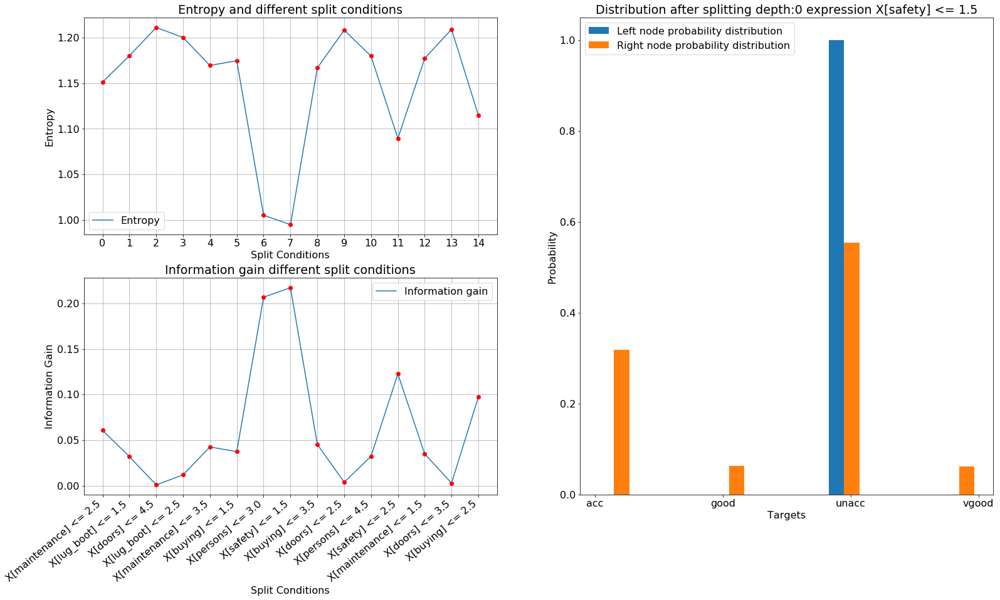

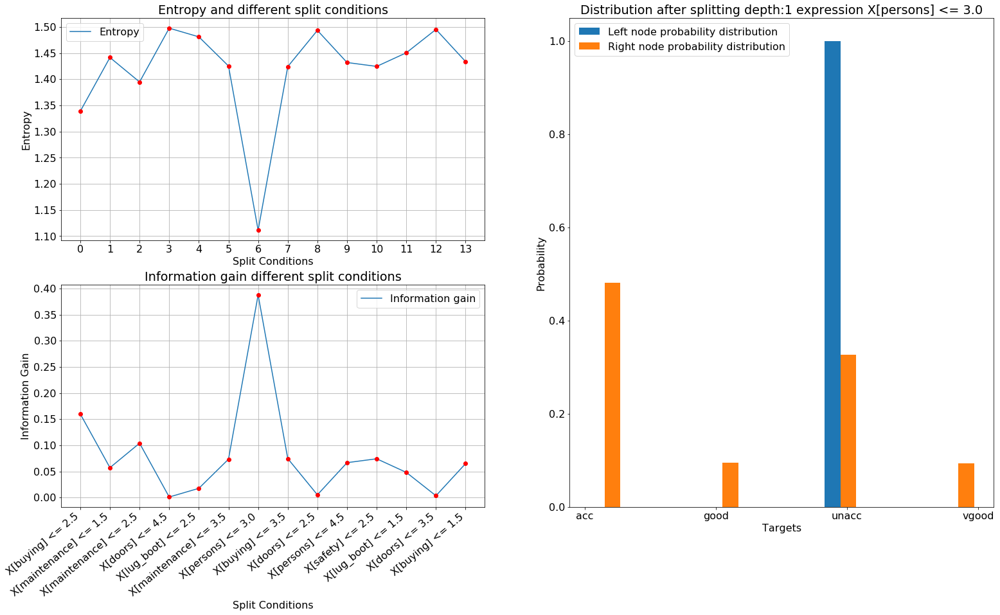

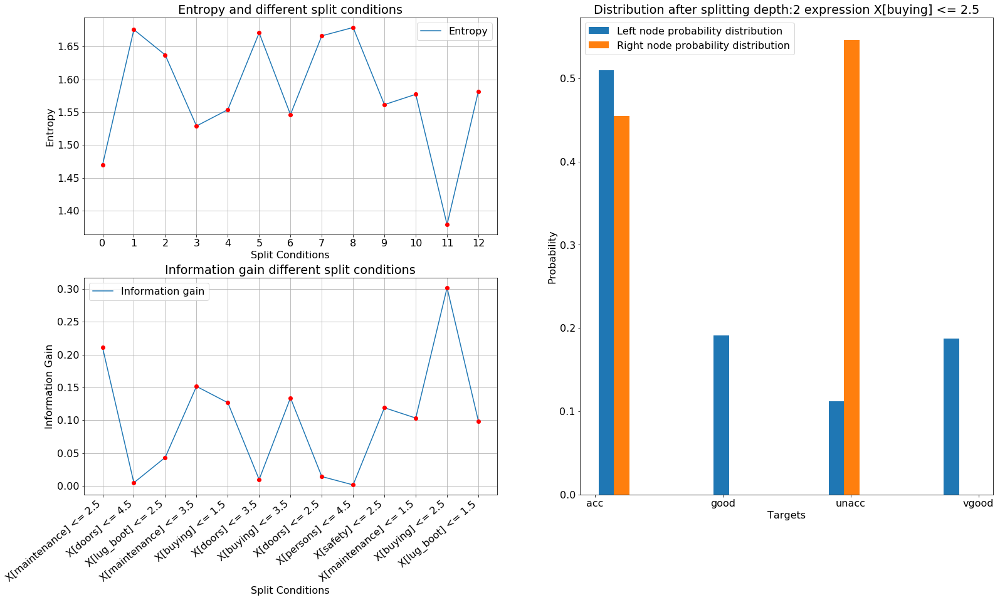

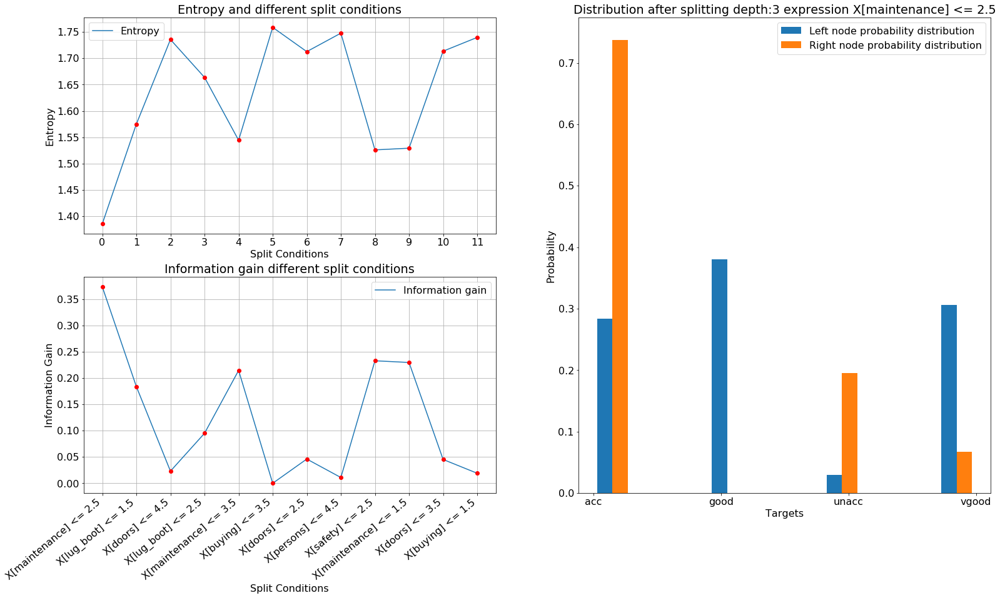

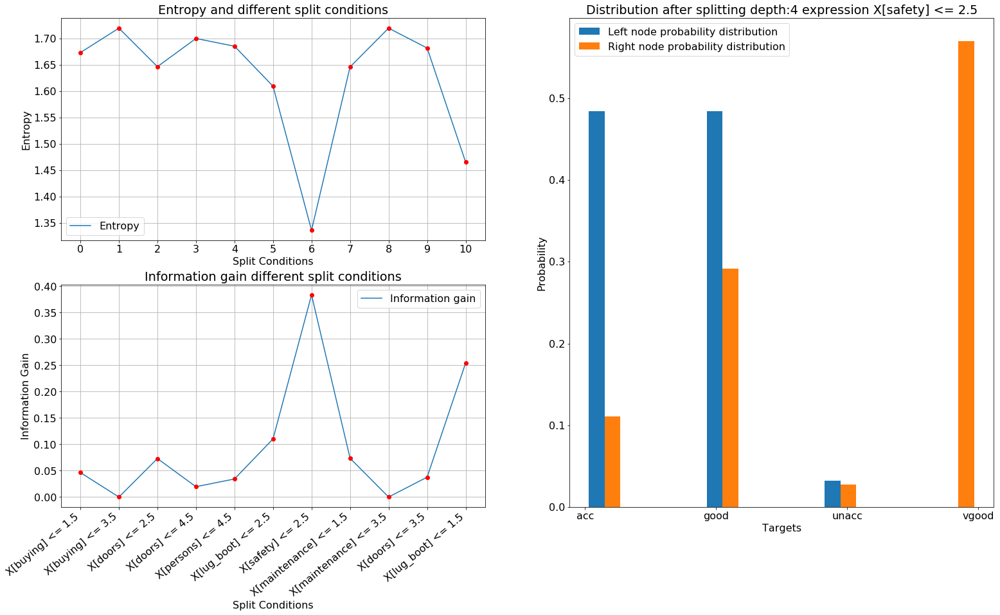

...

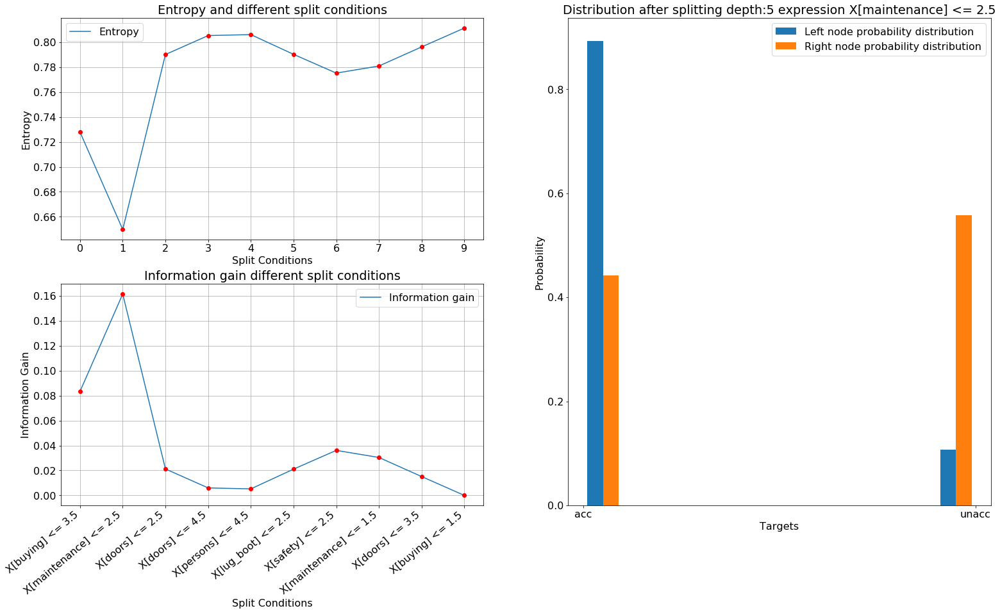

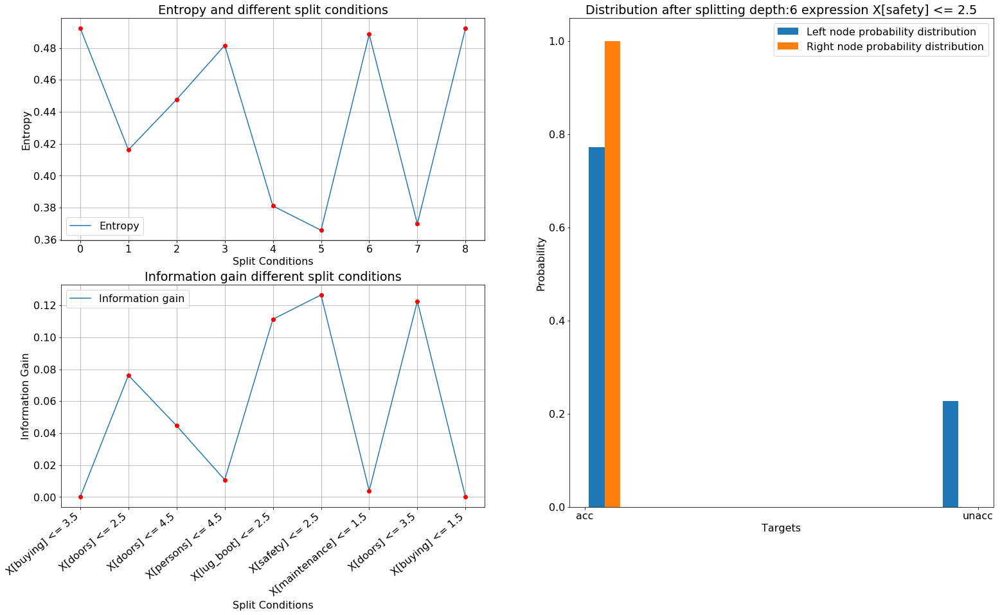

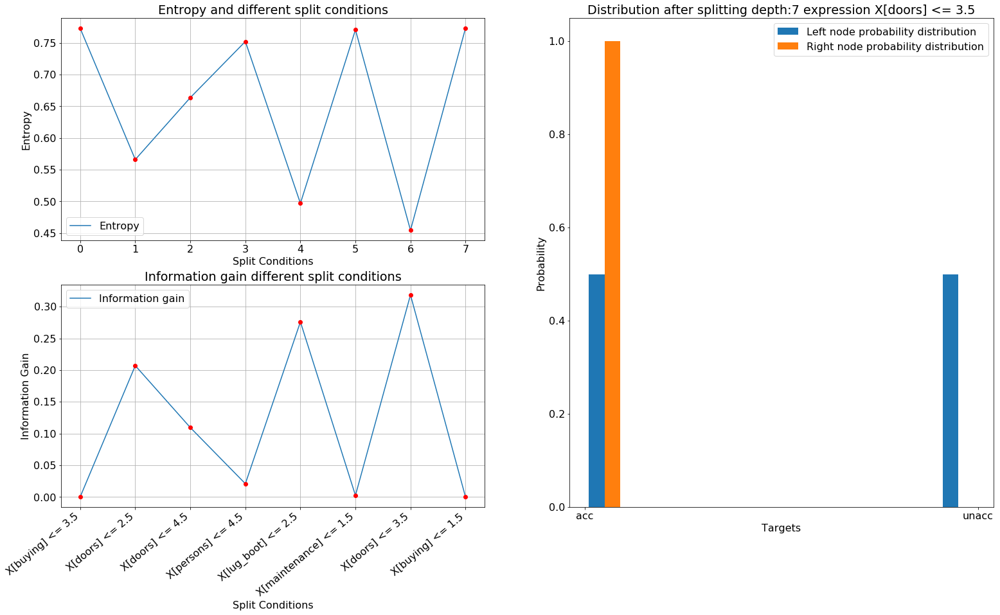

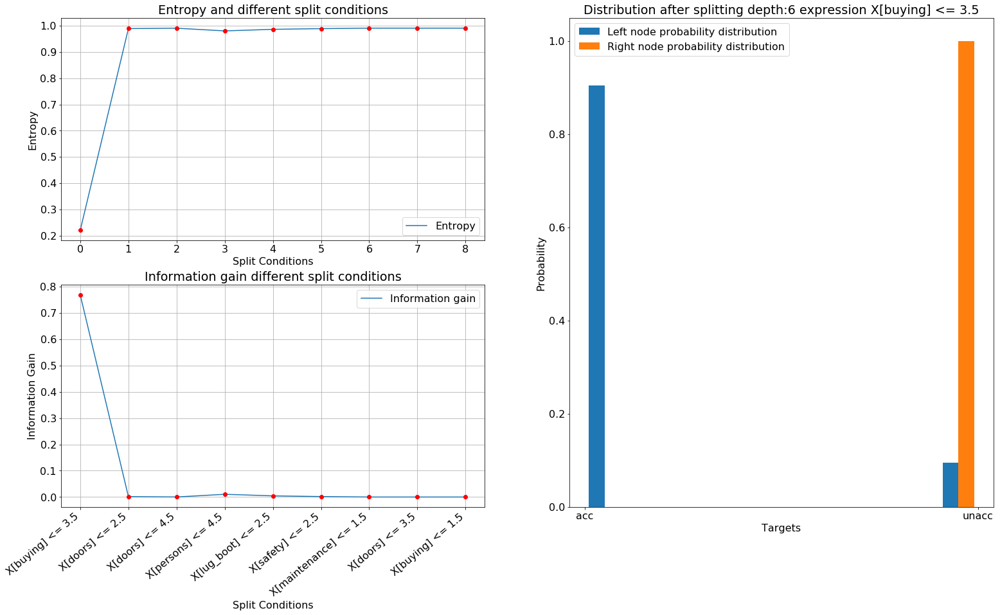

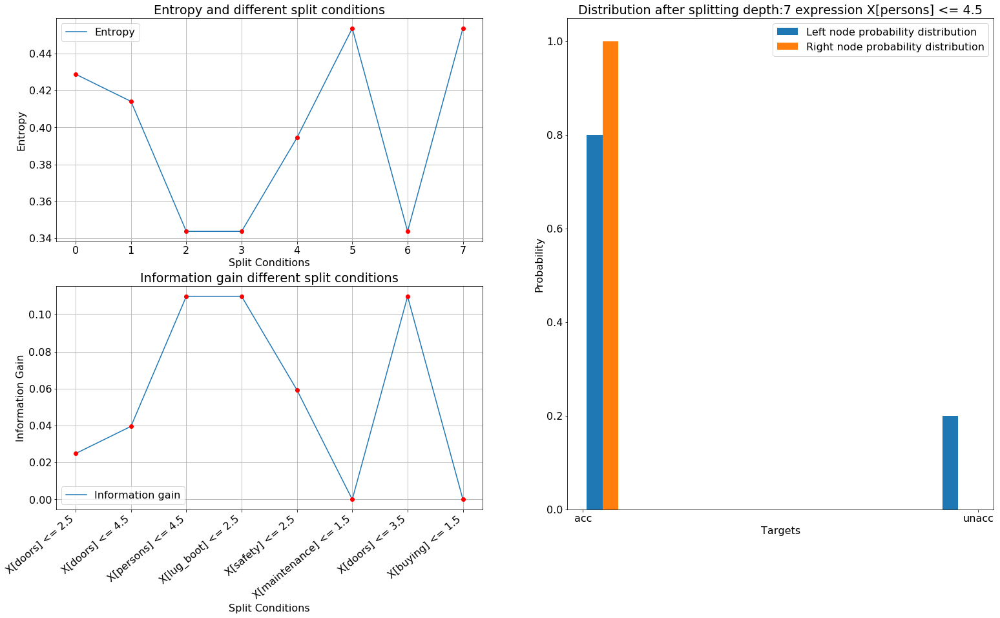

In [17]:
classifier = DecisionTreeClassifier(trainSet.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety']).astype(np.float), 
                       np.array(trainSet['target'].values), SplitFunction.CrossEntropy, 8
                       ,[DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL],
                                    ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'])

## Decision Tree

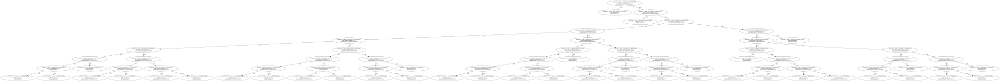

In [18]:
graph = Digraph(comment="Classification decision tree")
graph.graph_attr.update(size="82,100")

drawTree(classifier.head, 0)
graph

## BFS order tree
(DecisionFunction/TargetLabel, InformationGain, Depth)

In [19]:
classifier.bfs()

(X[safety] <= 1.5, 0.21740108208224684, 0)
(unacc, 0.0, 1)
(X[persons] <= 3.0, 0.3876835473008975, 1)
(unacc, 0.0, 2)
(X[buying] <= 2.5, 0.3019083641942282, 2)
(X[maintenance] <= 2.5, 0.373655523066204, 3)
(X[maintenance] <= 3.5, 0.2945599693501533, 3)
(X[safety] <= 2.5, 0.38356973012665185, 4)
(X[safety] <= 2.5, 0.16779930614070593, 4)
(X[lug_boot] <= 1.5, 0.11938302978877213, 4)
(unacc, 0.0, 4)
(X[lug_boot] <= 1.5, 0.36354699367572774, 5)
(X[lug_boot] <= 1.5, 0.5301845978026493, 5)
(X[lug_boot] <= 2.5, 0.28839047740577195, 5)
(X[maintenance] <= 3.5, 0.16681636152701695, 5)
(X[safety] <= 2.5, 0.49355458947533676, 5)
(X[maintenance] <= 2.5, 0.16147020268094991, 5)
(X[doors] <= 2.5, 0.28726525688988197, 6)
(X[maintenance] <= 1.5, 0.14583334489747368, 6)
(X[buying] <= 1.5, 0.3326842510625244, 6)
(X[doors] <= 3.5, 0.1961722585796436, 6)
(X[lug_boot] <= 1.5, 0.143669718529982, 6)
(acc, 0.0, 6)
(X[buying] <= 1.5, 0.4145546692892291, 6)
(X[doors] <= 2.5, 0.11948740273335093, 6)
(unacc, 0.0, 

## Prediction

In [20]:
xTest = testSet.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'])
yTest = np.array(testSet['target'].values)
yPrediction = []
yLogLoss = []

for x,y in zip(xTest,yTest):
    yPrediction.append(classifier.predict(x.astype(np.float)))
    yLogLoss.append(classifier.getLogLoss(x.astype(np.float), y))

In [21]:
loss = misclassificationRate(yTest, yPrediction)
print("Misclassification rate is "+str(loss))
print("Log loss is "+str(np.sum(yLogLoss)))
print("Normalized Log loss "+str(np.sum(yLogLoss)/len(yLogLoss)))

Misclassification rate is 0.03281853281853282
Log loss is 74.9974181058
Normalized Log loss 0.144782660436


# Decision tree using Gini Index

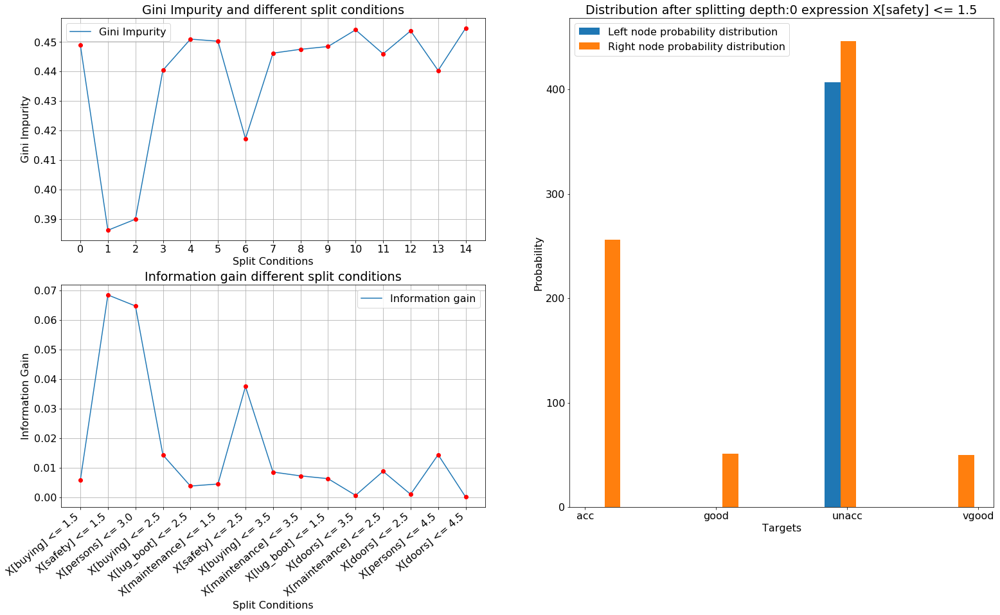

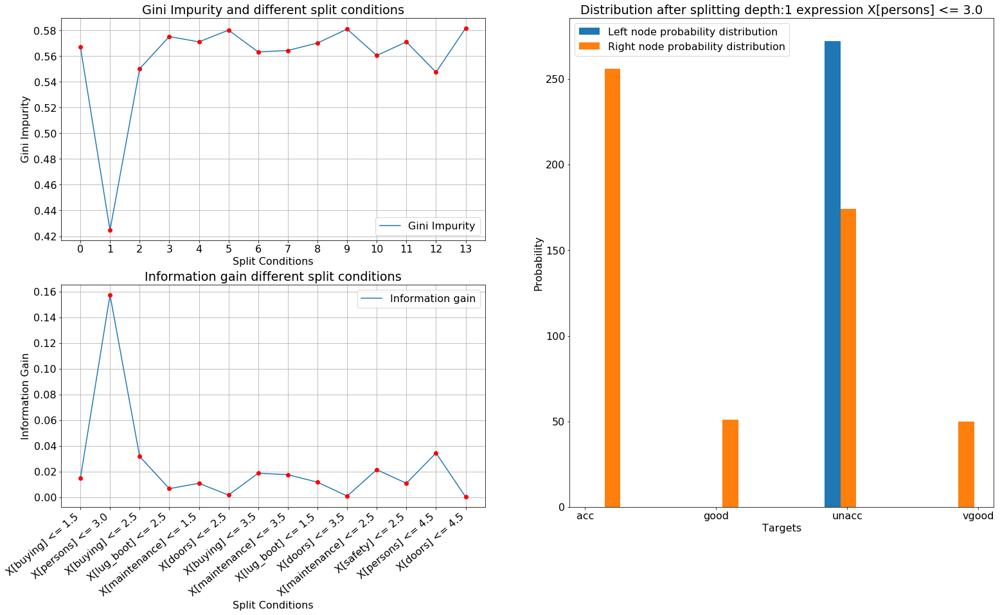

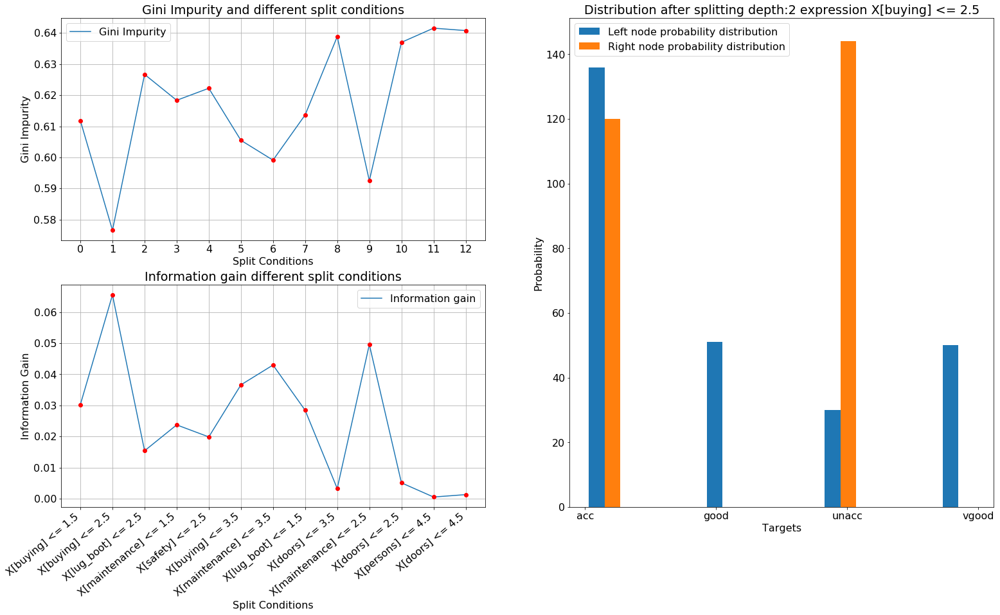

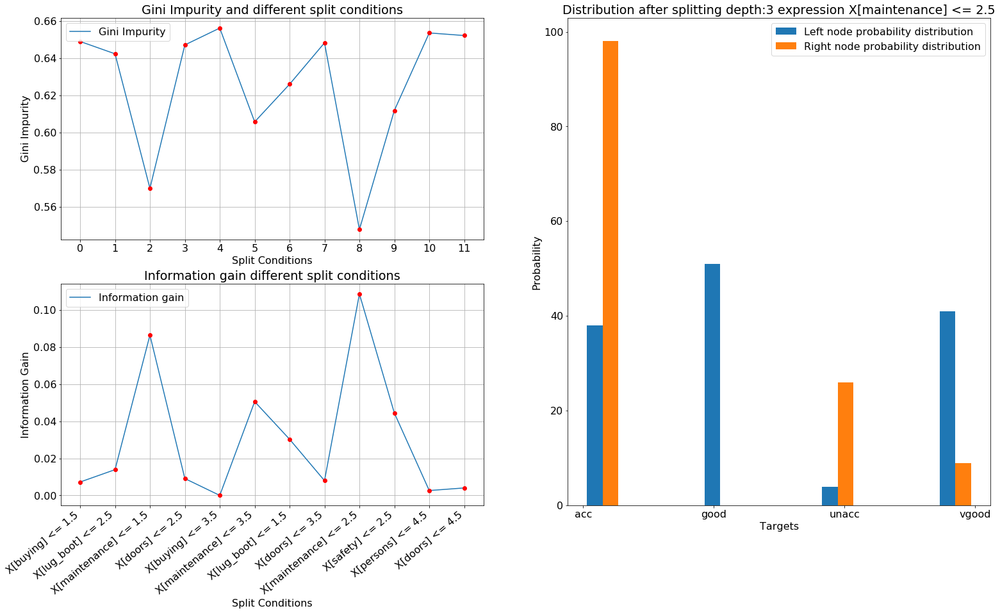

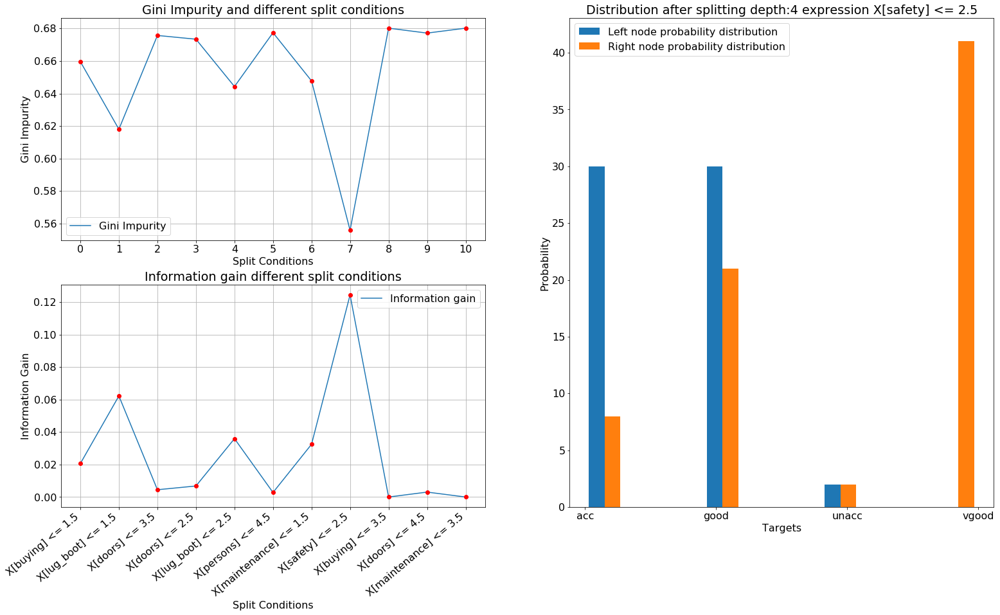

...

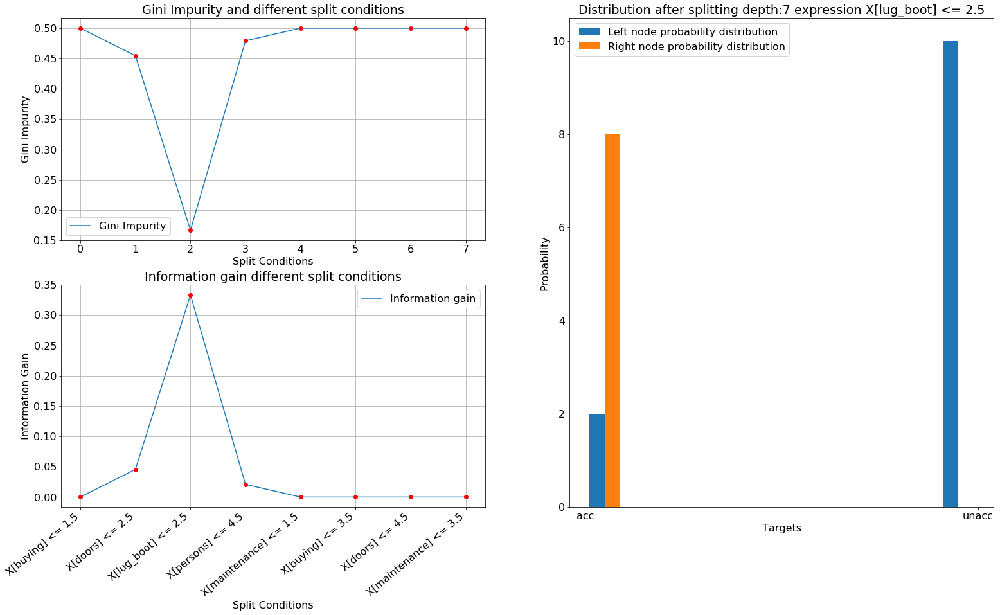

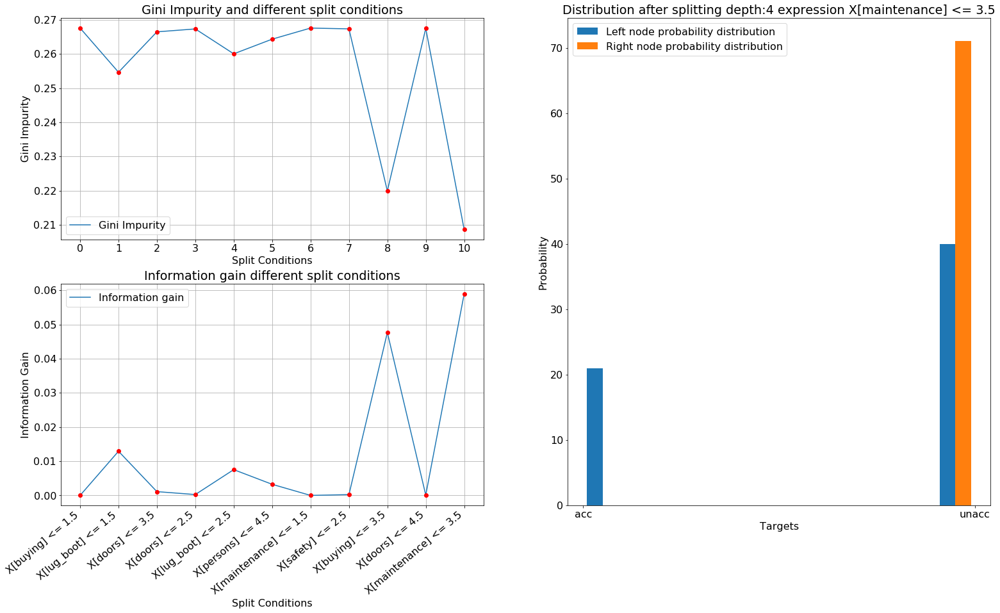

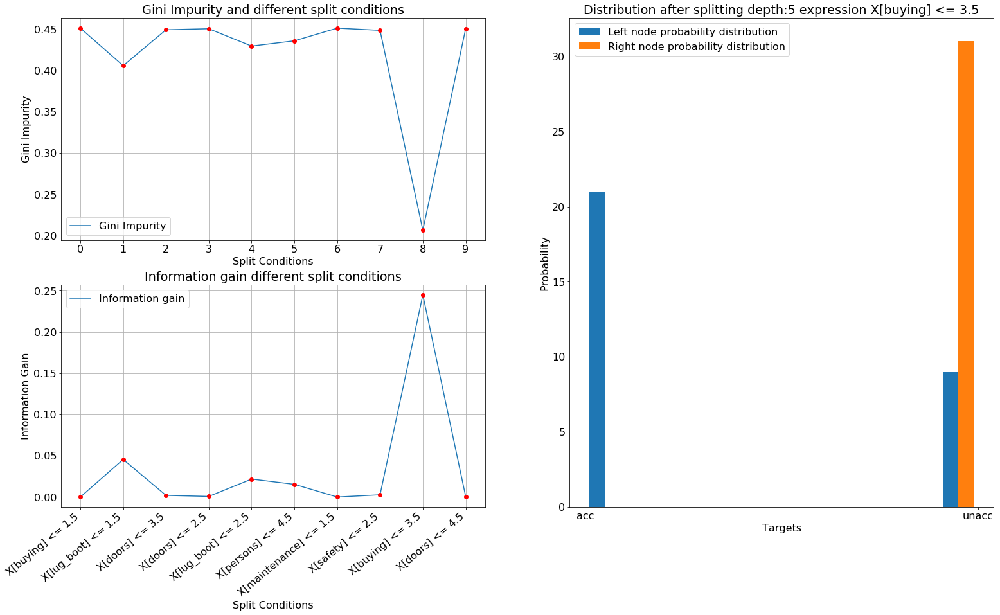

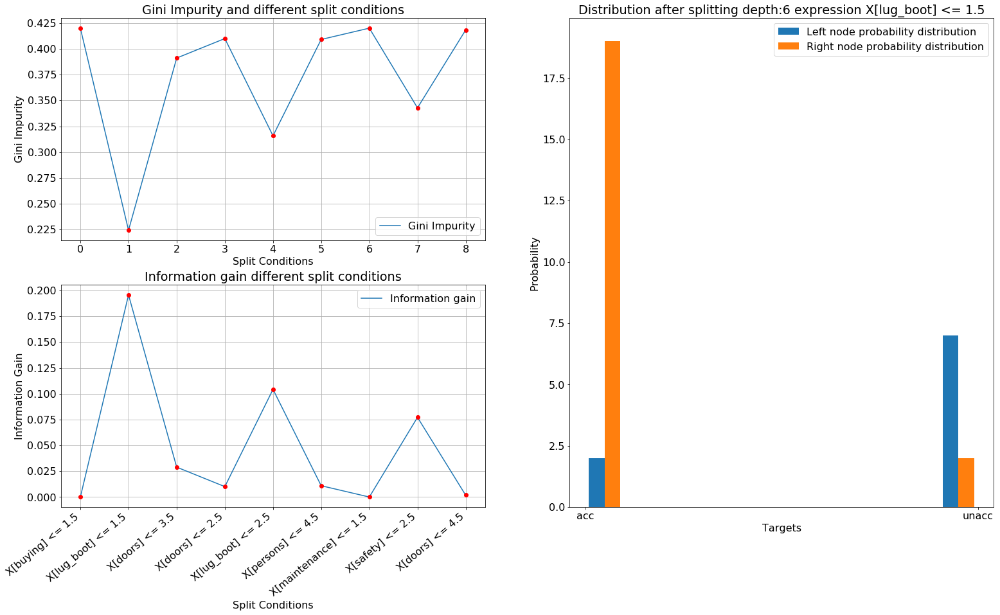

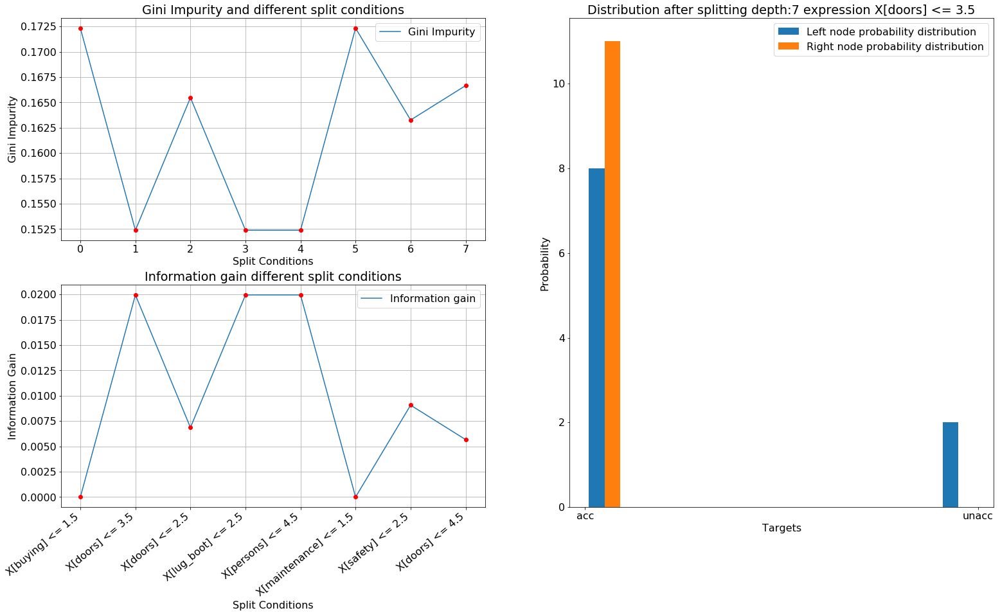

In [22]:
classifier = DecisionTreeClassifier(trainSet.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety']).astype(np.float), 
                       np.array(trainSet['target'].values), SplitFunction.GiniIndex, 8
                       ,[DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL],
                                    ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'])

## Decision Tree

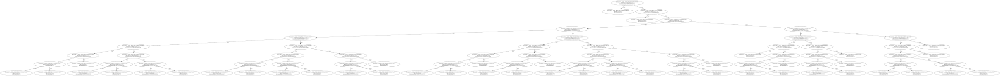

In [23]:
graph = Digraph(comment="Classification decision tree")
graph.graph_attr.update(size="82,100")

drawTree(classifier.head, 0)
graph

## BFS order tree
(DecisionFunction/TargetLabel, GiniIndex, Depth)

In [24]:
classifier.bfs()

(X[safety] <= 1.5, 0.06857438250437647, 0)
(unacc, 0.0, 1)
(X[persons] <= 3.0, 0.1573609883612916, 1)
(unacc, 0.0, 2)
(X[buying] <= 2.5, 0.06553042986888769, 2)
(X[maintenance] <= 2.5, 0.10862898216233141, 3)
(X[maintenance] <= 2.5, 0.17458677685950424, 3)
(X[safety] <= 2.5, 0.12434846710118175, 4)
(X[lug_boot] <= 1.5, 0.05084124642889998, 4)
(X[lug_boot] <= 1.5, 0.09680865729252819, 4)
(X[maintenance] <= 3.5, 0.058918168269882026, 4)
(X[lug_boot] <= 1.5, 0.15119054906041485, 5)
(X[lug_boot] <= 1.5, 0.21734427609427598, 5)
(X[safety] <= 2.5, 0.18157419606694963, 5)
(X[buying] <= 1.5, 0.017303719008264273, 5)
(X[safety] <= 2.5, 0.31978961209730444, 5)
(X[safety] <= 2.5, 0.02575179474242953, 5)
(X[buying] <= 3.5, 0.2449341574845472, 5)
(unacc, 0.0, 5)
(X[doors] <= 2.5, 0.0899653979238755, 6)
(X[maintenance] <= 1.5, 0.08816914080071969, 6)
(X[buying] <= 1.5, 0.12823691460055103, 6)
(X[doors] <= 3.5, 0.046523076923077056, 6)
(X[buying] <= 1.5, 0.10469681547186288, 6)
(X[doors] <= 2.5, 0.07

## Prediction

In [25]:
xTest = testSet.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'])
yTest = np.array(testSet['target'].values)
yPrediction = []

for x in xTest:
    yPrediction.append(classifier.predict(x.astype(np.float)))

In [26]:
loss = misclassificationRate(yTest, yPrediction)
print("Misclassification rate is "+str(loss))
print("Log loss is "+str(np.sum(yLogLoss)))
print("Normalized Log loss "+str(np.sum(yLogLoss)/len(yLogLoss)))

Misclassification rate is 0.0250965250965251
Log loss is 74.9974181058
Normalized Log loss 0.144782660436


## Conclusion
Both methods are giving same trees. The misclassification rate is 0.02 for both trees.

# Tree Pruning

In [39]:
trainSet, rest = splitDataSet(carsData, 0.34)
validation, test = splitDataSet(rest, 0.5)
print("Total items in data set "+str(len(carsData)))
print("Train set length "+str(len(trainSet)))
print("Validation set length " + str(len(validation)))
print("Test set length "+ str(len(test)))

Total items in data set 1728
Train set length 588
Validation set length 570
Test set length 570


In [40]:
classifier = DecisionTreeClassifier(trainSet.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety']).astype(np.float), 
                       np.array(trainSet['target'].values), SplitFunction.CrossEntropy, 20
                       ,[DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL, DType.ORDINAL],
                                    ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'],False)

# Before Pruning tree

In [41]:
xTest = test.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety'])
yTest = np.array(test['target'].values)

yPredictionPrePruning = []
yLogLossPrePruning = []

for x,y in zip(xTest,yTest):
    yPredictionPrePruning.append(classifier.predict(x.astype(np.float)))
    yLogLossPrePruning.append(classifier.getLogLoss(x.astype(np.float), y))
    
lossPrePruning = misclassificationRate(yTest, yPredictionPrePruning)
print("Misclassification rate is "+str(lossPrePruning))
print("Log loss is "+str(np.sum(yLogLossPrePruning)))
print("Normalized Log loss "+str(np.sum(yLogLossPrePruning)/len(yLogLossPrePruning)))

Misclassification rate is 0.0456140350877193
Log loss is 359.203274507
Normalized Log loss 0.630181183346


In [42]:
classifier.prune(validation.as_matrix(columns = ['buying', 'maintenance','doors', 'persons',
                                                     'lug_boot', 'safety']).astype(np.float), np.array(validation['target'].values))

PrePruning misclassification rate 0.054385964912280704 PostPruning misclassification rate 0.052631578947368425for node (X[buying] <= 1.5, 1.0, 7)

Pruning

PrePruning misclassification rate 0.052631578947368425 PostPruning misclassification rate 0.052631578947368425for node (X[doors] <= 2.5, 0.28103611255342353, 6)

PrePruning misclassification rate 0.052631578947368425 PostPruning misclassification rate 0.054385964912280704for node (X[buying] <= 1.5, 1.0, 10)

PrePruning misclassification rate 0.052631578947368425 PostPruning misclassification rate 0.054385964912280704for node (X[doors] <= 2.5, 0.31127812445913283, 9)

PrePruning misclassification rate 0.052631578947368425 PostPruning misclassification rate 0.054385964912280704for node (X[persons] <= 4.5, 0.14269027946047563, 8)

PrePruning misclassification rate 0.052631578947368425 PostPruning misclassification rate 0.04912280701754386for node (X[maintenance] <= 1.5, 0.8112781244591328, 8)

Pruning

PrePruning misclassification rate

In [43]:
yPredictionPostPruning = []
yLogLossPostPruning = []
for x,y in zip(xTest,yTest):
    yPredictionPostPruning.append(classifier.predict(x.astype(np.float)))
    yLogLossPostPruning.append(classifier.getLogLoss(x.astype(np.float), y))
    
lossPostPruning = misclassificationRate(yTest, yPredictionPostPruning)
print("Misclassification rate is "+str(lossPostPruning))
print("Log loss is "+str(np.sum(yLogLossPostPruning)))
print("Normalized Log loss "+str(np.sum(yLogLossPostPruning)/len(yLogLossPostPruning)))

Misclassification rate is 0.042105263157894736
Log loss is 271.546435943
Normalized Log loss 0.476397256041


In [44]:
 display(HTML(
    '<html><table width=50% style="font-size: 20px;"><tr><td><b>Metric</b></td><td><b>Before Pruning</b></td><td><b>After Pruning</b></td></tr><tr><td><b>Misclassification Rate</b></td><td>'+str(lossPrePruning)+'</td><td>'+str(lossPostPruning)+'</td></tr><tr><td><b>Log Loss</b></td><td>'+str(np.sum(yLogLossPrePruning))+'</td><td>'+str(np.sum(yLogLossPostPruning))+'</td></tr><tr><td><b>Log Loss Normalized</b></td><td>'+str(np.sum(yLogLossPrePruning)/len(yLogLossPrePruning))+'</td><td>'+str(np.sum(yLogLossPostPruning)/len(yLogLossPostPruning))+'</td></tr></table></html>'))

Metric,Before Pruning,After Pruning
Misclassification Rate,0.0456140350877193,0.042105263157894736
Log Loss,359.203274507,271.546435943
Log Loss Normalized,0.630181183346,0.476397256041


There is improvement in misclassification rate after pruning. The logloss has also reduced.